# Исследование рынка общественного питания Москвы

**Описание проекта:** 

Исследование рынка  общественного питания Москвы для помощи инвесторам из фонда «Shut Up and Take My Money» в выборе подходящего места для открытия нового заведения.

**Источник данных:** датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

**План выполнения проекта:**

1. [Загрузка данных и изучение общей информации](#1)

2. [Предобработка данных](#2)

3. [Анализ данных](#3)
- [Категории заведений](#3.1)
- [Количество посадочных мест в заведениях](#3.2)
- [Соотношение сетевых и нсетевых заведений](#3.3)
- [Топ-15 популярных сетей в Москве](#3.4)
- [Распределение заведений по административным округам](#3.5)
- [Распределение средних рейтингов по категориям заведений](#3.6)
- [Распределение средних рейтингов по административным округам](#3.7)
- [Отображение всех заведений на карте](#3.8)
- [Топ-15 улиц по по количеству заведений](#3.9)
- [Улицы с единственным заведением](#3.10)
- [Размер среднх чеков заведений по административным округам](#3.11)
- [Размер средних чеков по категориям заведений](#3.12)
- [Выводы из проведенного анализа данных](#3.13)

4. [Детализация исследования:открытие кофейни](#4)
- [Количество кофеен и особенности их расположения](#4.1)
- [Время работы кофеен](#4.2)
- [Рейтинги кофеен](#4.3)
- [Стоимость чашки капучино](#4.4)
- [Рекомендации по открытию кофейни](#4.5)

5. [Презентация](#5)

## Загрузка данных и изучение общей информации
<a id="1"></a> 

In [1]:
# Импортирую нужные библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
import warnings
warnings.simplefilter("ignore")
pd.set_option("display.float_format", "{:.2f}".format)
# Импортирую карту и хороплет
from folium import Map, Choropleth, Marker
# Импортирую кластер
from folium.plugins import MarkerCluster
# Импортирую собственные иконки
from folium.features import CustomIcon

In [2]:
# Загружаю данные
try: places = pd.read_csv('/datasets/moscow_places.csv')
except: places = pd.read_csv('moscow_places.csv')

In [3]:
# Изучаю общую информацию о данных
display(places.head())
display(places.info())
display(places.describe())
display(places.isna().sum()) 
print('Количество дубликатов:', places.duplicated(subset=['name', 'address']).sum())
print('Количество заведений:', places['name'].nunique())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.00,8406.00,8406.00,3149.00,535.00,8406.00,4795.00
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,1009.73,88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,1250.00,225.00,1.00,140.00
max,55.93,37.87,5.00,35000.00,1568.00,1.00,1288.00


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Количество дубликатов: 0
Количество заведений: 5614


Дополню проверку данных на наличие дубликатов.

In [4]:
# Приведу содержание колонок 'name', 'category', 'address' к нижнему регистру
places['name'] = places['name'].str.lower()
places['category'] = places['category'].str.lower()
places['address'] = places['address'].str.lower()

Заменю дубликаты в столбце 'name'. 

In [5]:
places['name'] = places['name'].str.replace('ё', 'е')

In [6]:
places[places.name.str.contains('яндекс')]['name'].unique()

array(['яндекс лавка', 'яндекс.лавка', 'яндекс еда'], dtype=object)

In [7]:
places['name'] = places['name'].str.replace('яндекс.лавка', 'яндекс лавка')

In [8]:
places[places.name.str.contains('домино')]['name'].unique()

array(["домино'с пицца", 'доминос пицца', "домино'с"], dtype=object)

In [9]:
#Создам функцию для замены дубликатов
def replace_duplicates(wrong_value, correct_value):
    for wrong_value in wrong_values:
        places['name'] = places['name'].str.replace(wrong_value, correct_value)

In [10]:
wrong_values = ["домино'с пицца", "домино'с", 'доминос пицца']
correct_value = "доминос пицца"
replace_duplicates(wrong_values, correct_value)

In [11]:
places[places.name.str.contains('кебаб')]['name'].unique()

array(['донер кебаб', 'кебабушки.ру', 'кебаб', 'москебаб',
       'донер кебаб № 1', 'донер-кебаб', 'кебаб-хауз', 'кебаб хаус',
       'мустафа кебаб', 'хан кебаб', 'казан - кебаб', 'кебабс',
       'кебаб хауз', 'донец кебаб', 'дом кебаба', 'афган-кебаб',
       'люля-кебаб и шаурма'], dtype=object)

In [12]:
wrong_values = ['кебаб-хауз', 'кебаб хаус']
correct_value = 'кебаб хауз'
replace_duplicates(wrong_values, correct_value)

In [13]:
places['name'] = places['name'].str.replace('донер-кебаб', 'донер кебаб')

In [14]:
# Нахожу дубликаты по сумме параметров
print('Количество дубликатов по сумме параметров name и address:', \
      places.duplicated(subset=['name', 'address']).sum())
print('Количество дубликатов по сумме параметров category, lat, lng:', \
      places.duplicated(subset=['category', 'lat', 'lng']).sum())

Количество дубликатов по сумме параметров name и address: 4
Количество дубликатов по сумме параметров category, lat, lng: 18


In [15]:
# Удаляю найденные дубликаты
places = places.drop_duplicates(subset=['name', 'address'])
places = places.drop_duplicates(subset=['category', 'lat', 'lng'])       

In [16]:
# Изучаю общую информацию о данных после удаления дубликатов
display(places.info())
display(places.isna().sum()) 
print('Количество заведений:', places['name'].nunique())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8385 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8385 non-null   object 
 1   category           8385 non-null   object 
 2   address            8385 non-null   object 
 3   district           8385 non-null   object 
 4   hours              7851 non-null   object 
 5   lat                8385 non-null   float64
 6   lng                8385 non-null   float64
 7   rating             8385 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3813 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8385 non-null   int64  
 13  seats              4783 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 982.6+ KB


None

name                    0
category                0
address                 0
district                0
hours                 534
lat                     0
lng                     0
rating                  0
price                5072
avg_bill             4572
middle_avg_bill      5239
middle_coffee_cup    7850
chain                   0
seats                3602
dtype: int64

Количество заведений: 5487


**Описание данных:**

- *name* — название заведения. Пропуски отсутствуют. Тип данных - object, изменение типа данных не требуется.
- *category* — категория заведения. Пропуски отсутствуют. Тип данных - object, изменение типа данных не требуется.
- *address* — адрес заведения. Пропуски отсутствуют. Тип данных - object, изменение типа данных не требуется.
- *district* — административный округ, в котором находится заведение. Пропуски отсутствуют. Тип данных - object, изменение типа данных не требуется.
- *hours* — информация о днях и часах работы. В столбце 534 пропуска, это более 6% всех значений; заполнение или удаление этих данных может привести к искажению результатов исследования, поэтому оставлю пропуски. Тип данных - object, изменение типа данных не требуется.
- *lat* — широта географической точки, в которой находится заведение. Пропуски отсутствуют. Тип данных - float64, изменение типа данных не требуется.
- *lng* — долгота географической точки, в которой находится заведение. Пропуски отсутствуют. Тип данных - float64, изменение типа данных не требуется.
- *rating* — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0). Пропуски отсутствуют. Тип данных - float64, изменение типа данных не требуется.
- *price* — категория цен в заведении. В столбце 5072 пропуска, это более половины всех значений; заполнение или удаление этих данных может привести к искажению результатов исследования, поэтому оставлю пропуски. Тип данных - object, изменение типа данных не требуется.
- *avg_bill* — строка, которая хранит среднюю стоимость заказа. В столбце 4572 пропуска, это более половины всех значений; заполнение или удаление этих данных может привести к искажению результатов исследования, поэтому оставлю пропуски. Тип данных - object, изменение типа данных не требуется.
- *middle_avg_bill* — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт». В столбце 5239 пропусков, это более половины всех значений; заполнение или удаление этих данных может привести к искажению результатов исследования, поэтому оставлю пропуски. Тип данных - float64, изменение типа данных не требуется.
- *middle_coffee_cup* — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино». В столбце 7850 пропусков, это более половины всех значений; заполнение или удаление этих данных может привести к искажению результатов исследования, поэтому оставлю пропуски. Тип данных - float64, изменение типа данных не требуется.
- *chain* — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым. Пропуски отсутствуют. Тип данных - int64, изменение типа данных не требуется.
- *seats* — количество посадочных мест. В столбце 3602 пропусков, это 43% всех значений; заполнение или удаление этих данных может привести к искажению результатов исследования, поэтому оставлю пропуски. Тип данных - float64, изменение типа данных не требуется.

**Вывод**
- В датасете 8385 строк.
- Представлена информация о 5487 заведениях. 
- Типы данных соответствуют значениям. 
- Изменять название столбцов не требуется.
- Дубликаты удалены.
- В столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats имеются пропуски, их довольно большое количество. При их удалении могут возникнуть искажения в исследовании. Поэтому удалять их не стоит. Также полагаю, что заполнять пропуски тоже некорректно.

## Предобработка данных
<a id="2"></a> 

In [17]:
# Создаю столбец street с названиями улиц из столбца с адресом
places['street'] = places['address'].str.split(', ').str[1]

In [18]:
# Создаю столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
# True — если заведение работает ежедневно и круглосуточно; 
# False — в противоположном случае.
places['is_24/7'] = places['hours'].str.contains('ежедневно, круглосуточно')

In [19]:
# Проверяю добавленные столбцы
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False


Найду редкие и аномальные значения в данных.        

In [20]:
# Посмотрю на распределение значений в данных
places.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,8385.00,55.75,0.07,55.57,55.71,55.75,55.80,55.93
lng,8385.00,37.61,0.10,37.36,37.54,37.61,37.66,37.87
rating,8385.00,4.23,0.47,1.00,4.10,4.30,4.40,5.00
middle_avg_bill,3146.00,958.28,1010.02,0.00,375.00,750.00,1250.00,35000.00
middle_coffee_cup,535.00,174.72,88.95,60.00,124.50,169.00,225.00,1568.00
chain,8385.00,0.38,0.49,0.00,0.00,0.00,1.00,1.00
seats,4783.00,108.06,121.62,0.00,40.00,75.00,140.00,1288.00


Рассмотрю подробнее значения в столбцах 'middle_avg_bill', 'middle_coffee_cup' и 'seats'. 

In [21]:
# Создам функцию для построения гистограммы и диаграммы размаха
def dist(a, b):
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    ax = sns.distplot(places[a])
    plt.title(b)
    plt.subplot(1, 2, 2)
    ax = sns.boxplot(places[a])
    plt.title(b)
    plt.show()

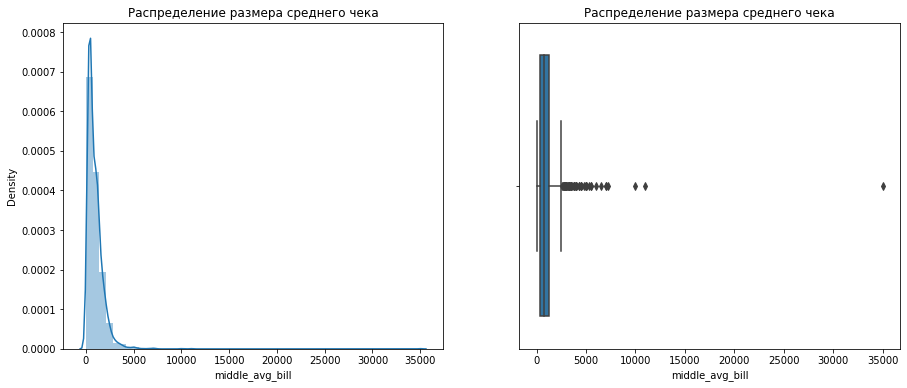

In [22]:
# Построю графики для столбца 'middle_avg_bill'
dist('middle_avg_bill', 'Распределение размера среднего чека')

Есть всего одна запись со значением столбца 'middle_avg_bill' равным 35000. Найду это заведение.

In [23]:
places[places['middle_avg_bill'] == 35000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
7177,кафе,ресторан,"москва, каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.66,37.65,4.10,высокие,Средний счёт:20000–50000 ₽,35000.00,NaN,0,100.00,каширское шоссе,True


Вызывает сомнение, что какой-то ресторан на Каширском шоссе с названием "Кафе" может иметь средний чек в размере 35000. Кроме того по этому адресу располагается ФГБУ Нмиц онкологии им. Н. Н. Блохина Минздрава России. Поэтому удалю эту запись.

In [24]:
places = places.query('middle_avg_bill != 35000')

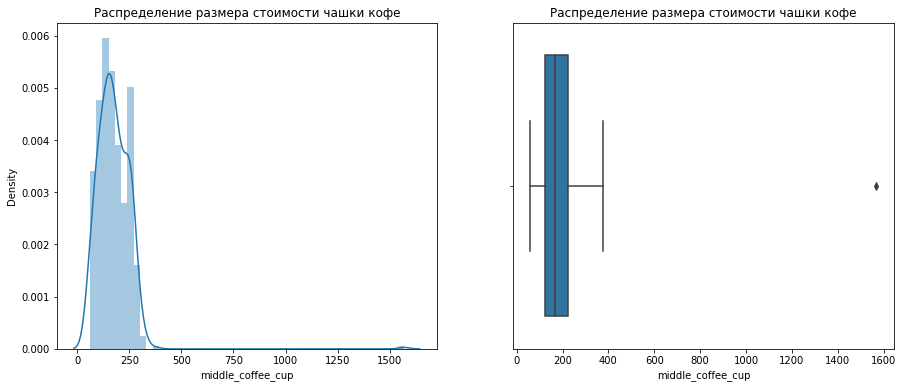

In [25]:
# Построю графики для столбца 'middle_coffee_cup'
dist('middle_coffee_cup', 'Распределение размера стоимости чашки кофе')

Вызывает интерес кофе дороже 1400 рублей. Найду эти записи.

In [26]:
places[places['middle_coffee_cup'] > 1400]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2859,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.78,37.71,4.20,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.00,1,48.00,большая семёновская улица,False


Вызывает сомнение, что кофе в кофейне "Шоколадница" может стоить 1568 рублей. Заменю это значение на медианное по всем Шоколадницам.

In [27]:
places.loc[places['middle_coffee_cup'] > 1400, 'middle_coffee_cup'] \
= places[places['name'] == 'шоколадница']['middle_coffee_cup'].median()

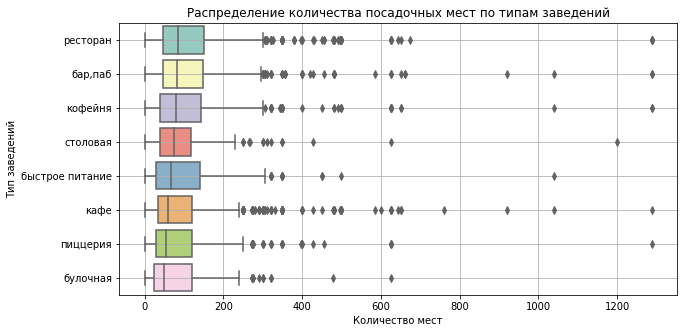

In [28]:
# Исследую количество посадочных мест в заведениях по категориям с помощью диаграммы размаха
plt.figure(figsize=(10, 5))
order = places.groupby('category')['seats'].median().sort_values(ascending=False).index
ax = sns.boxplot(data=places, x='seats', y='category', palette='Set3', order=order)
plt.title('Распределение количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.grid()

По графику видно, что в количестве посадочных мест есть выбросы. Скорее всего они связаны с ошибкой при заполнении данных. Установлю допустимую границу в 550 мест. Посчитаю, в скольких заведениях это число превышено.

In [29]:
print('Количество заведений с числом мест более 550:', places[places['seats'] > 550]['name'].count())
print('Доля заведений с числом мест более 550:',\
      round((places[places['seats'] > 550]['name'].count())/(places['name'].nunique())*100, 2),'%')

Количество заведений с числом мест более 550: 55
Доля заведений с числом мест более 550: 1.0 %


Таких заведений 1%. Полагаю их можно удалить.

In [30]:
places_550 = places[places['seats'] > 550]
places = places.query('index not in @places_550.index')

In [31]:
# Посчитаю количество заведений после удаления аномальных значений
print('Количество заведений:', places['name'].nunique())

Количество заведений: 5461


In [32]:
# Узнаю размер датафрейма после удаления аномалий
print(places.shape) 

(8329, 16)


**Вывод**

В результате предобработки данных:
- создан столбец street с названиями улиц,
- создан столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно,
- обработаны аномальные значения в столбцах 'middle_avg_bill', 'middle_coffee_cup' и 'seats'.

После обработки данных 
- в датасете осталось 8329 строк,
- представлена информация о 5461 заведениях.

## Анализ данных
<a id="3"></a> 

### Категории заведений
<a id="3.1"></a> 

In [33]:
# Рассмотрю распеделение заведений по категориям
categories = places.groupby('category')['name'].count().reset_index().sort_values(by='name')
categories.columns = ['category', 'count']
categories

,category,count
1,булочная,255
7,столовая,313
2,быстрое питание,601
5,пиццерия,628
0,"бар,паб",754
4,кофейня,1401
6,ресторан,2023
3,кафе,2354


In [88]:
# Визуализирую результат с помощью столбчатой диаграммы

fig = px.bar(categories,
             x='count',
             y='category',
             text = 'count',
             title = 'Количество заведений общественного питания по категориям'
             )

fig.update_layout(xaxis_title = 'Количество заведений',
                  yaxis_title = 'Категории заведений',
                  xaxis={'categoryorder':'total descending'},
                  template='plotly_white',
                  height=370,
                  width=600)


fig.show()

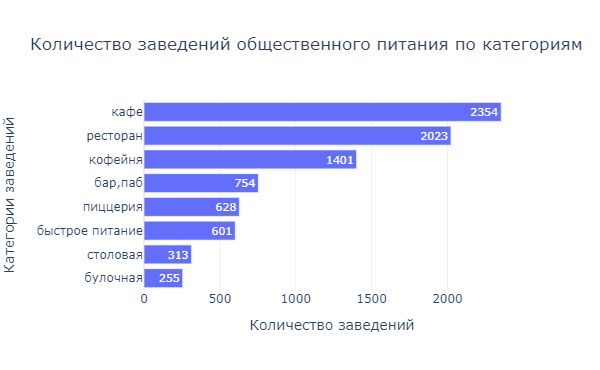

**Вывод**

По количеству заведений лидируют кафе с численностью 2354 заведений, немного меньше ресторанов - 2023 заведений. На последнем месте булочные - 255 заведений.

### Количество посадочных мест в заведениях по категориям
<a id="3.2"></a>

In [35]:
# Исследую медианное количество посадочных мест в заведениях по категориям
seats_median = places[places['seats'] !=0].groupby('category')['seats']\
.median().reset_index().sort_values(by='seats', ascending=False)
seats_median.columns = ['category', 'seats_median']
seats_median

,category,seats_median
6,ресторан,87.00
0,"бар,паб",80.00
4,кофейня,80.00
7,столовая,76.00
2,быстрое питание,75.00
3,кафе,60.00
5,пиццерия,55.00
1,булочная,51.00


In [89]:
# Визуализирую результат с помощью столбчатой диаграммы

fig = px.bar(seats_median,
             x='seats_median',
             y='category',
             text = round(seats_median.seats_median),
             title = 'Медианное количество мест в заведениях в Москве'
             )

fig.update_layout(yaxis_title = 'Категории заведений',
                  xaxis_title = 'Количество мест',
                  xaxis={'categoryorder':'total descending'},
                  template='plotly_white',
                  height=350,
                  width=550)


fig.show()

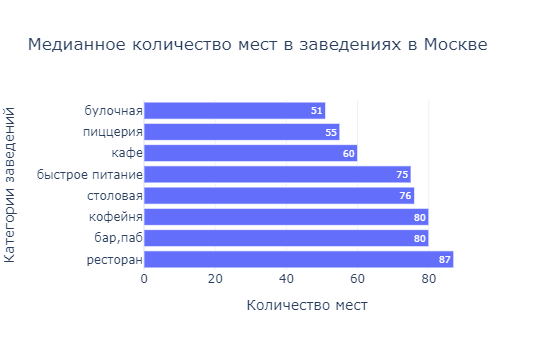

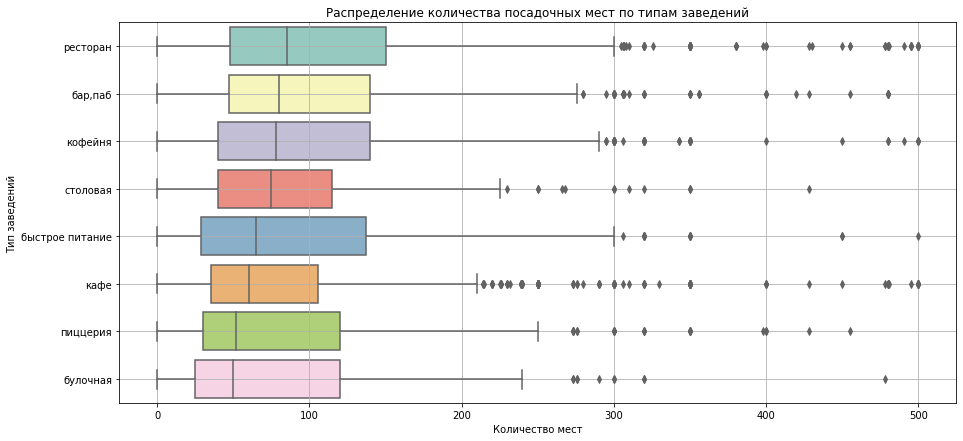

In [37]:
# Исследую количество посадочных мест в заведениях по категориям с помощью диаграммы размаха
plt.figure(figsize=(15, 7))
order = places.groupby('category')['seats'].median().sort_values(ascending=False).index
ax = sns.boxplot(data=places, x='seats', y='category', palette='Set3', order=order)
plt.title('Распределение количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.grid()

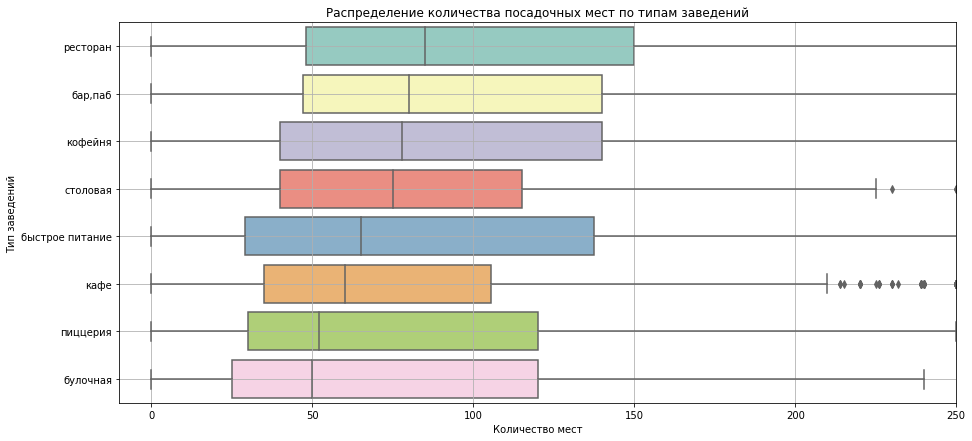

In [38]:
# Тот же график в увеличенном маштабе
plt.figure(figsize=(15, 7))
order = places.groupby('category')['seats'].median().sort_values(ascending=False).index
ax = sns.boxplot(data=places, x='seats', y='category', palette='Set3', order=order)
plt.title('Распределение количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.xlim(-10, 250)
plt.grid()

**Вывод**

В среднем больше всего посадочных мест в ресторанах и барах. Далее идут столовые и кофейни. Булочные располагают наименьшим количеством мест. 

### Cоотношение сетевых и несетевых заведений
<a id="3.3"></a>

In [39]:
# Рассмотрю соотношение сетевых и несетевых заведений
chain = places['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5156
1,1,3173


In [96]:
# Визуализирую результат с помощью руговой диаграммы
fig = go.Figure(data=[go.Pie(labels=['Несетевые', 'Сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.update_layout(height=350, width=430)
fig.show()

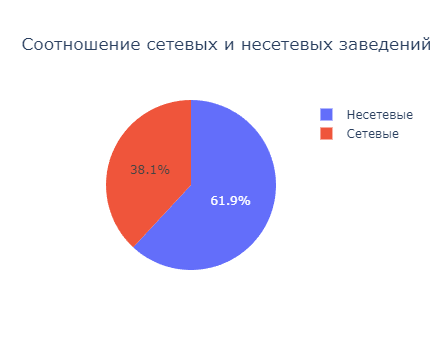

На графике видно, что большинство заведений в Москве (почти 62%) - несетевые.

In [41]:
# Найду долю сетевых заведений среди общего числа по категориям
chain_share = places.pivot_table(index='category', values='name', columns='chain', aggfunc='count').reset_index()
chain_share.columns = ['category', 'not_chain', 'chain']
chain_share['chain_share'] = (chain_share['chain']/(chain_share['chain']+chain_share['not_chain']))*100
chain_share = chain_share.sort_values('chain_share', ascending = False)
chain_share

,category,not_chain,chain,chain_share
1,булочная,99,156,61.18
5,пиццерия,300,328,52.23
4,кофейня,688,713,50.89
2,быстрое питание,370,231,38.44
6,ресторан,1304,719,35.54
3,кафе,1582,772,32.80
7,столовая,226,87,27.80
0,"бар,паб",587,167,22.15


In [98]:
# Визуализирую результат
fig = px.bar(chain_share,
             x='chain_share',
             y='category',
             text = round(chain_share.chain_share),
             title = 'Доля сетевых заведений по категориям'
             )

fig.update_layout(yaxis_title = 'Категории заведений',
                  xaxis_title = 'Доля сетевый заведений',
                  xaxis={'categoryorder':'total descending'},
                  template='plotly_white',
                  height=350,
                  width=500)

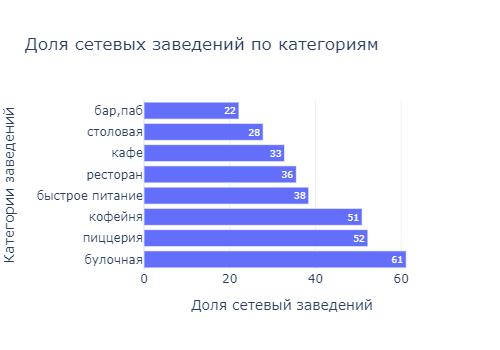

**Вывод**

Большая часть заведений в Москве несетевые (62%). В разрезе категорий наименьшая доля сетевых среди баров и пабов (22%). Далее идут столовые, кафе, рестораны и заведения быстрого питания. Там доля сетевых от 30 до 40%. Среди кофеен и пиццерий соотношение сетевых и несетевых заведений примерно поровну. А среди булочных сетевых заведений больше, их доля 61%.

### Топ-15 популярных сетей в Москве
<a id="3.4"></a>

In [43]:
# Группирую данные по названиям заведений и нахожу топ-15 популярных сетей в Москве
chains = places[places['chain'] == 1]
top_15 = chains.groupby('name').agg({'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,category,count
0,шоколадница,кофейня,118
1,доминос пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,яндекс лавка,ресторан,71
4,one price coffee,кофейня,70
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,кафе,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,38


In [44]:
# Визуализирую результат 
fig = px.bar(top_15,
             x='count',
             y='name',
             text='count',
             template='plotly_white',
             color='name',
             height=500,
             width=1000
             )
fig.update_layout(title = 'Топ-15 популярных сетей Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  showlegend = False)
fig.show()

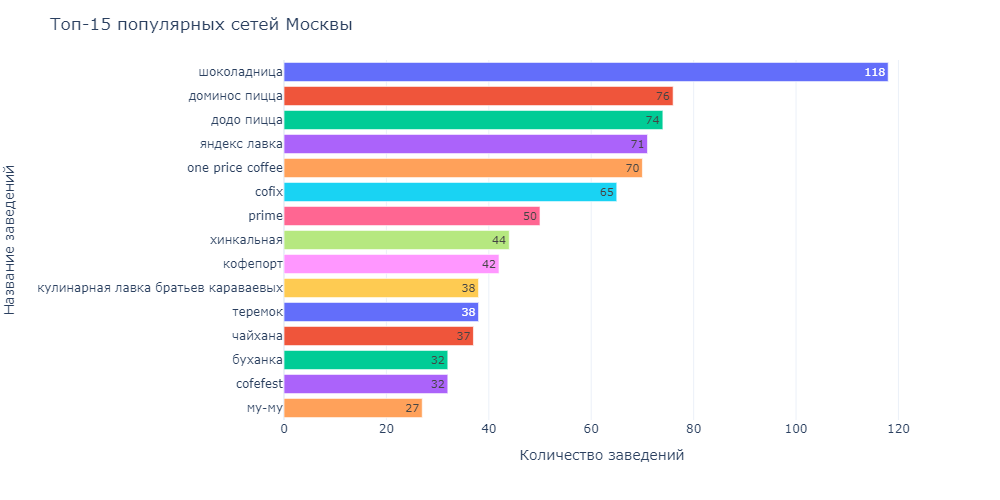

In [45]:
# Распределяю топ-15 сетей по категориям
top_15_pivot = top_15.pivot_table(index='category', values='count', aggfunc='sum').reset_index()
top_15_pivot

,category,count
0,булочная,32
1,кафе,146
2,кофейня,327
3,пиццерия,150
4,ресторан,159


In [102]:
# Визуализирую результат в виде круговой диаграммы
fig = go.Figure(data=[go.Pie(labels=top_15_pivot['category'], values=top_15_pivot['count'])], layout=go.Layout(
        title=go.layout.Title(text="Распределение категорий заведений среди топ-15")))
fig.update_layout(height=400, width=500)
fig.show()

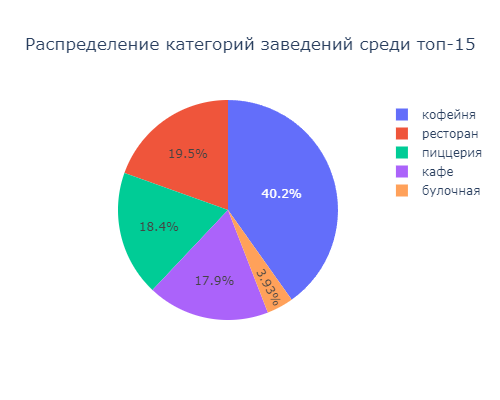

**Вывод**

- Самая популярная сеть в Москве - кофейня Шоколадница. Далее идут пиццерии Домино'с Пицца и Додо Пицца. Замыкает топ-15 кафе Му-му.
- Большая часть заведений среди самых популярных - это кофейни, далее примерно в равных долях идут рестораны, пиццерии и кафе, меньше всего среди самых популярных сетей булочных. Остальные категории в топ-15 сетей не попали.

### Распределение заведений по административным округам
<a id="3.5"></a>

In [47]:
# Группирую данные по административным округам
districts = places.groupby(['district', 'category']).agg({'name': 'count'})
districts = districts.sort_values('name', ascending=False).reset_index()
districts.columns = ['district', 'category', 'count']
districts

,district,category,count
0,Центральный административный округ,ресторан,668
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,281
...,...,...,...
67,Западный административный округ,столовая,23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [106]:
# Визуализирую результат

fig = px.bar(districts,
             x='count',
             y='district',
             template='plotly_white',
             color='category'
            )
fig.update_layout(title = 'Количество заведений каждой категории по административным округам Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Округ',
                  yaxis={'categoryorder': 'total ascending'},
                  legend_title='Категории заведений'
                  )

fig.show()

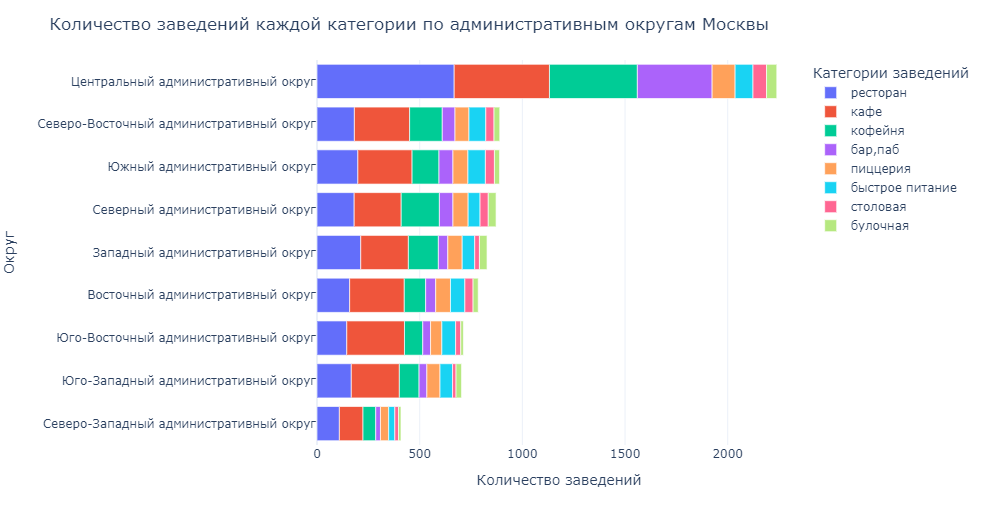

**Вывод**

В датасете представлено 9 административных округов. В Центральном административном округе располагается значительно больше заведений, чем в других округах. Там преобладают рестораны, кафе, кофейни и бары. В других округах также преобладают рестораны, кафе и кофейни. Булочных и столовых меньше всего во всех округах.

### Распределение средних рейтингов по категориям
<a id="3.6"></a>

In [49]:
# Группирую данные по среднему рейтингу
ratings_cat = places.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
ratings_cat

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [108]:
# Визуализирую результат
fig = px.bar(ratings_cat,
             x='rating',
             y='category',
             text='rating',
             template='plotly_white',
             color='category'
            )
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Категории заведений',
                  legend_title=' ',
                  height=400, width=800
                 )
fig.show()

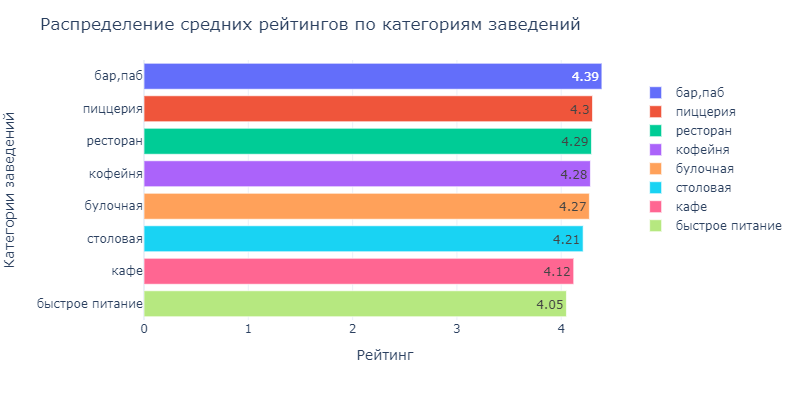

**Вывод**

Самый высокий рейтинг у баров и пабов (4,39), далее идут пиццерии, рестораны и кофейни, самый низкий рейтинг у ресторанов быстрого питания (4,05).

### Распределение средних рейтингов по административным округам
<a id="3.7"></a>

In [51]:
# Группирую данные по среднему рейтингу и округу
ratings_disrt = places.groupby('district', as_index=False)['rating']\
.agg('mean').round(2).sort_values('rating', ascending=False)
ratings_disrt

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.19
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [52]:
# Отображаю распределение заведений по административным округам на карте

# Загружаю JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# Обозначаю координаты Москвы: moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаю карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаю хороплет
Choropleth(
    geo_data=state_geo,
    data=ratings_disrt,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по административным округам',
    fill_opacity=0.8
).add_to(m1)

# Вывожу карту
m1

**Вывод**

Самый высокий рейтинг в заведениях Центрального административного округа - 4.38. Самый низкий - в Юго-Восточном администратвном округе - 4.10.

### Отображение всех заведений на карте
<a id="3.8"></a>

In [53]:
# Группирую данные по количеству заведений в каждом округе
district_count = places.groupby('district', as_index=False)['name'].agg('count').round(2).sort_values('name', ascending=False)
district_count

,district,name
5,Центральный административный округ,2239
3,Северо-Восточный административный округ,890
8,Южный административный округ,889
2,Северный административный округ,872
1,Западный административный округ,828
0,Восточный административный округ,785
6,Юго-Восточный административный округ,713
7,Юго-Западный административный округ,704
4,Северо-Западный административный округ,409


In [54]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_count,
    columns=['district', 'name'],
    key_on='feature.name',
    legend_name='Количество заведений по административным округам',
    fill_opacity=0.8
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

def create_cluster(row):
    icon_url = 'https://img.icons8.com/?size=50&id=611&format=png'  
    icon = CustomIcon(icon_url, icon_size=(20, 20))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)
    
places.apply(create_cluster, axis=1)

m

**Вывод**

На карте видно, что в центре Москвы расположено больше всего заведений.

### Топ-15 улиц по количеству заведений
<a id="3.9"></a>

In [55]:
# Нахожу топ-15 улиц по количеству заведений
msc_streets = places[places['street'].notnull()]
top15_streets = msc_streets['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street', 'count']
top15_streets

,street,count
0,проспект мира,183
1,профсоюзная улица,121
2,ленинский проспект,106
3,проспект вернадского,96
4,дмитровское шоссе,88
5,варшавское шоссе,76
6,каширское шоссе,76
7,ленинградский проспект,72
8,ленинградское шоссе,70
9,мкад,65


In [56]:
# Создаю таблицу с названиями улиц и категорий
streets_category = places.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,street,category,count
2136,проспект мира,кафе,53
1519,мкад,кафе,45
2139,проспект мира,ресторан,45
2137,проспект мира,кофейня,36
2148,профсоюзная улица,кафе,34
...,...,...,...
1534,молодёжная улица,"бар,паб",1
1535,молодёжная улица,кофейня,1
1537,монтажная улица,кофейня,1
1538,монтажная улица,ресторан,1


In [57]:
# Оставляю в таблице только улицы из топ-15
streets15_category = streets_category[streets_category['street'].isin(top15_streets['street'])]
streets15_category

,street,category,count
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3173,улица миклухо-маклая,быстрое питание,4
3174,улица миклухо-маклая,кафе,20
3175,улица миклухо-маклая,кофейня,4
3176,улица миклухо-маклая,пиццерия,2


In [58]:
# Визуализирую распределение категорий заведений на 15 самых популярных улицах

fig = px.bar(streets15_category,
             x='count',
             y='street',
             template='plotly_white',                   
             color='category'
            )

fig.update_layout(title='Распределение категорий заведений по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'},
                   legend_title='Категории заведений'
                 )
fig.show()

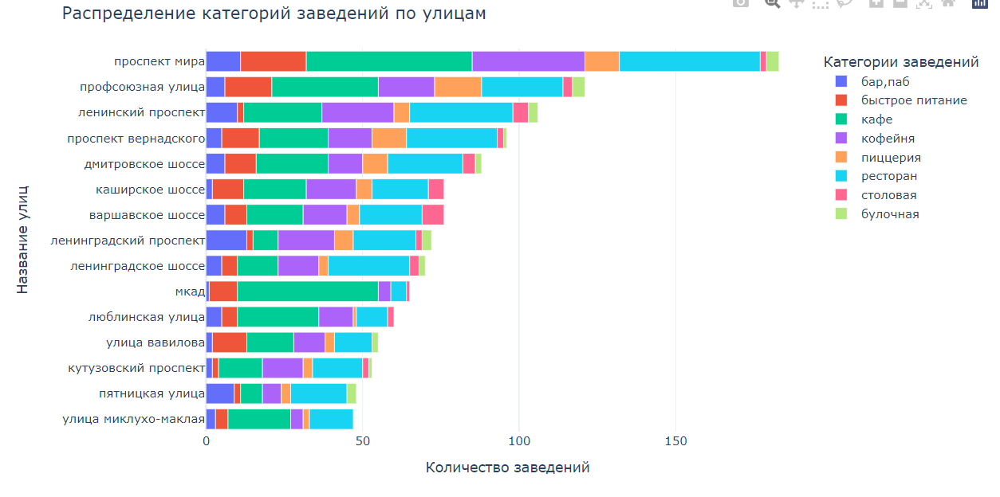

**Вывод** 

На проспекте Мира располагается значительно больше заведений, чем на других улицах - 183 заведения. Там преобладают кафе, рестораны и кофейни. Столовых меньше всего. Следом идет Профсоюзная улица - 121 заведение. Распределение заведений по категориями там аналогичное. Замыкают топ-15 улиц по количеству заведений Пятницкая улица и улица Миклухо-Маклая - 48 и 47 заведений соответственно. На улице Миклухо-Маклая больше кафе и ресторанов. На Пятницкой больше всего ресторанов.

### Улицы с единственным заведением
<a id="3.10"></a>

In [59]:
# Нахожу улицы, на которых расположено только одно заведение
streets_1 = places['street'].value_counts().reset_index()
streets_1.columns = ['street', 'count']
streets_1 = streets_1[streets_1['count']==1]
streets_1.street

989                  промышленный проезд
990             2-я звенигородская улица
991                    одинцовская улица
992                 ставропольская улица
993               улица старые кузьминки
                      ...               
1442             1-й вешняковский проезд
1443    таганский парк культуры и отдыха
1444                   токмаков переулок
1445              мерзляковский переулок
1446               товарищеский переулок
Name: street, Length: 458, dtype: object

In [60]:
# Посмотрю к каким категориям относятся эти заведения
streets_1_cat = streets_category[streets_category['street'].isin(streets_1['street'])]
streets_1_cat = streets_1_cat.groupby('category')['street'].count().sort_values(ascending=False)
streets_1_cat

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

In [61]:
# Выберу данные с информацией об улицах с единственным заведением
places_streets_1 = places.query('street in @streets_1.street')

In [62]:
# Группирую данные количеству таких улиц в каждом округе
district_count_streets_1 = places_streets_1.groupby('district', as_index=False)['street'].agg('count')\
.round(2).sort_values('street', ascending=False)
district_count_streets_1

,district,street
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


In [63]:
# Отображаю на карте количество улиц с единственным заведением по округам
m7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_count_streets_1,
    columns=['district', 'street'],
    key_on='feature.name',
    legend_name='Количество улиц с единственным заведением по административным округам',
    fill_opacity=0.8
).add_to(m7)

m7

**Вывод** 

- На 458 улицах расположено только одно заведение. Больше всего - это кафе (160).
- На карте видно, что в ЦАО больше всего улиц, на которых расположено одно заведение. Это можно объяснить тем, что в ЦАО всего наибольшее число заведений по Москве. Кроме того, в центре больше маленьких переулков, на которых может располагаться только одно заведение. Меньше всего улиц с единственным заведением в Северо-Западном и Юго-Западном округах.

### Размер средних чеков заведений по административным округам
<a id="3.11"></a>

In [64]:
# Посчитаю медиану столбца middle_avg_bill для каждого округа
median_bill_dist = places.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
median_bill_dist

,district,middle_avg_bill
0,Западный административный округ,1000.00
1,Центральный административный округ,1000.00
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,550.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


In [65]:
# Создаю хороплет с полученными значениями для каждого округа.

m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data = median_bill_dist,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Размер среднего чека заведений по округам, руб.',
).add_to(m2)

m2

**Вывод**

Самый высокий средний чек в Центральном и Западном округах, самый маленький - в Юго-Восточном. 

### Размер средних чеков по категориям заведений
<a id="3.12"></a>

In [66]:
# Проверю, в заведениях каких категорий самый высокий средний чек
median_bill_cat = places.groupby('category')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
median_bill_cat

,category,middle_avg_bill
0,"бар,паб",1250.00
1,ресторан,1250.00
2,пиццерия,600.00
3,кафе,550.00
4,булочная,450.00
5,кофейня,400.00
6,быстрое питание,375.00
7,столовая,300.00


In [111]:
# Визуализирую результат

fig = px.bar(median_bill_cat,
             x='middle_avg_bill',
             y='category',
             text='middle_avg_bill',
             template='plotly_white',
             color='category'
            )
fig.update_layout(title='Размер средних чеков по категориям заведений',
                  xaxis_title='Средний чек, руб.',
                  yaxis_title='Категории заведений',
                  legend_title=' ',
                  height=370, width=700
                 )

fig.show()

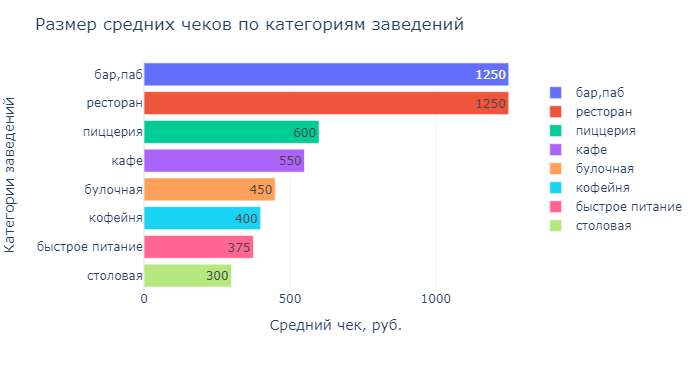

**Вывод**

Самыми дорогими заведениями являются рестораны и бары, самыми дешевыми - столовые.

Этим фактом может объясняться то, что в ЦАО наивысший средний чек. Т.к. там доля баров и ресторанов выше по сравнению с другими округами.

### Выводы из проведенного анализа данных
<a id="3.13"></a>

- Самые популярные заведения в Москве - это кафе (2354 заведений), немного меньше ресторанов - 2023 заведений. На последнем месте булочные - 255 заведения.
- В среднем больше всего посадочных мест в ресторанах и барах. Далее идут столовые и кофейни. Булочные располагают наименьшим количеством мест.
- Большая часть заведений в Москве несетевые (62%). В разрезе категорий наименьшая доля сетевых среди баров и пабов (22%). Далее идут столовые, кафе, рестораны и заведения быстрого питания. Там доля сетевых от 30 до 40%. Среди кофеен и пиццерий соотношение сетевых и несетевых заведений примерно поровну. А среди булочных сетевых заведений больше, их доля 61%.
- Самая популярная сеть в Москве - кофейня Шоколадница. Далее идут пиццерии Домино'с Пицца и Додо Пицца. Замыкает топ-15 кафе Му-му. Большая часть заведений среди самых популярных - это кофейни, далее примерно в равных долях идут рестораны, пиццерии и кафе, меньше всего среди самых популярных сетей булочных. Остальные категории в топ-15 сетей не попали.
- В датасете представлено 9 административных округов города Москвы. В Центральном административном округе располагается значительно больше заведений(2239), чем в других округах. Там преобладают рестораны, кафе, кофейни и бары. В других округах также преобладают рестораны, кафе и кофейни. Булочных и столовых меньше всего во всех округах. Меньше всего заведений в Северо-Западном округе (409).
- Самый высокий рейтинг у баров и пабов (4,39), далее идут пиццерии, рестораны и кофейни, самый низкий рейтинг у ресторанов быстрого питания (4,05).
- Самый высокий рейтинг в заведениях Центрального административного округа - 4.38. Самый низкий - в Юго-Восточном административном округе - 4.10.
- На проспекте Мира располагается значительно больше заведений, чем на других улицах - 183 заведения. Там преобладают кафе, рестораны и кофейни. Столовых меньше всего. Следом идет Профсоюзная улица - 121 заведение. Распределение заведений по категориями там аналогичное. Замыкают топ-15 улиц по количеству заведений Пятницкая улица и улица Миклухо-Маклая - 48 и 47 заведений соответственно. На улице Миклухо-Маклая больше кафе и ресторанов. На Пятницкой больше всего ресторанов.
- На 458 улицах расположено только одно заведение. Больше всего - это кафе (160). Больше всего улиц, на которых расположено одно заведение, в Центральном округе. Это можно объяснить тем, что в ЦАО всего наибольшее число заведений по Москве. Кроме того, в центре больше маленьких переулков, на которых может располагаться только одно заведение. Меньше всего улиц с единственным заведением в Северо-Западном и Юго-Западном округах.
- Самыми дорогими заведениями являются рестораны и бары, самыми дешевыми - столовые.
- Самый высокий средний чек в Центральном и Западном округах, самый маленький - в Юго-Восточном.

## Детализация исследования: открытие кофейни
<a id="4"></a>

### Количество кофеен и особенности их расположения
<a id="4.1"></a>

In [68]:
# Нахожу количество кофеен
coffee = places[places['category'] == 'кофейня']
print('Количество кофеин:', len(coffee))

Количество кофеин: 1401


In [69]:
# Группирую данные о кофейнях по административным округам
coffee_disrt = coffee.groupby('district', as_index=False)['name'].agg('count').round(2).sort_values('name', ascending=False)
coffee_disrt

,district,name
5,Центральный административный округ,428
2,Северный административный округ,186
3,Северо-Восточный административный округ,159
1,Западный административный округ,146
8,Южный административный округ,131
0,Восточный административный округ,104
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [70]:
# Отображаю кофейни на карте
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_disrt,
    columns=['district', 'name'],
    key_on='feature.name',
    legend_name='Количество кофеин по административным округам',
    fill_opacity=0.8
).add_to(m3)

marker_cluster = MarkerCluster().add_to(m3)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=50&id=37211&format=png'  
    icon = CustomIcon(icon_url, icon_size=(20, 20))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

coffee.apply(create_clusters, axis=1)

m3

**Вывод**

Всего в датасете 1401 кофеен. Больше всего их расположено в Центральном округе, меньше всего - в Северо-Западном.

### Время работы кофеен
<a id="4.2"></a>

In [71]:
# Нахожу количество круглосуточных кофеен
coffee_24 = coffee[coffee['is_24/7'] == True]
print('Количество круглосуточных кофеен:', len(coffee_24))

Количество круглосуточных кофеен: 59


In [113]:
# Визуализирую долю круглосуточных кафеен

coffee_24_count = coffee['is_24/7'].value_counts().reset_index()
coffee_24_count.columns = ['24/7', 'count']

fig = go.Figure(data=[go.Pie(labels=['Некруглосуточные', 'Круглосуточные'], values=coffee_24_count['count'])], layout=go.Layout(
        title=go.layout.Title(text="Доля круглосуточных кофеен")))
fig.update_layout(height=400, width=400)

fig.show()

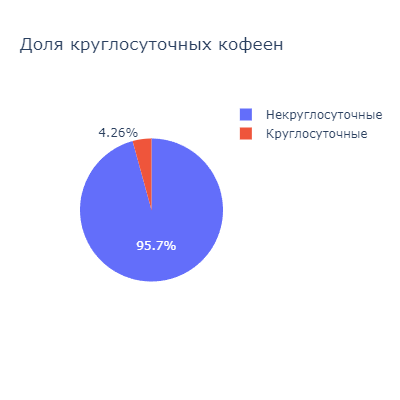

In [73]:
# Группирую данные о круглосуточных кофейнях по округам
coffee_disrt_24 = coffee_24.groupby('district', as_index=False)['name'].agg('count')\
.round(2).sort_values('name', ascending=False)
coffee_disrt_24

,district,name
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [74]:
# Отоброжаю круглосуточные кофейни на карте
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_disrt_24,
    columns=['district', 'name'],
    key_on='feature.name',
    legend_name='Количество круглосуточных кофеин по административным округам',
    fill_opacity=0.8
).add_to(m4)

marker_cluster = MarkerCluster().add_to(m4)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=50&id=37211&format=png'  
    icon = CustomIcon(icon_url, icon_size=(20, 20))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

coffee_24.apply(create_clusters, axis=1)

m4

**Вывод**

В датасете представлена информация о 59 круглосуточных кофейнях, это чуть более 4% от общего количества. Больше всего круглосуточных кофеен в Центральном округе - 26. В Юго-Восточном и в Южном округах всего по одной круглосуточной кофейне.

### Рейтинги кофеен
<a id="4.3"></a>

In [75]:
# Группирую данные о кофейнях по округам и среднему рейтингу
coffee_rating = coffee.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [76]:
# Отображаю распределение кофеин по административным округам на карте
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по административным округам',
).add_to(m5)

m5

**Вывод**

Кофейни с самым высоким рейтингом расположены в Центральном и Северо-Западном округах. В Западном округе кофейни с самым низким рейтингом.

### Стоимость чашки капучино
<a id="4.4"></a>

In [77]:
# Группирую данные о кофейнях по округам и средней стоимости чашки капучино
cup_of_coffee = coffee.groupby('district', as_index=False)['middle_coffee_cup'].\
agg('mean').round().sort_values('middle_coffee_cup', ascending=False)
display(cup_of_coffee)
mean_coffee_price = round(cup_of_coffee['middle_coffee_cup'].mean())
print(f'Средняя стоимость чашки кофе в Москве:', mean_coffee_price, 'рублей.')

,district,middle_coffee_cup
1,Западный административный округ,189.00
5,Центральный административный округ,188.00
7,Юго-Западный административный округ,184.00
2,Северный административный округ,166.00
4,Северо-Западный административный округ,166.00
3,Северо-Восточный административный округ,165.00
8,Южный административный округ,158.00
6,Юго-Восточный административный округ,151.00
0,Восточный административный округ,143.00


Средняя стоимость чашки кофе в Москве: 168 рублей.


In [116]:
# Визуализирую результат 
fig = px.bar(cup_of_coffee,
             x='middle_coffee_cup',
             y='district',
             text='middle_coffee_cup',
             template='plotly_white',
             color='district',
             height=500,
             width=1000
             )
fig.update_layout(title = 'Средняя стоимость чашки капучино',
                  xaxis_title = 'Стоимость, руб.',
                  yaxis_title = 'Наименование округа',
                  showlegend = False,
                 height=370, width=800)
fig.show()

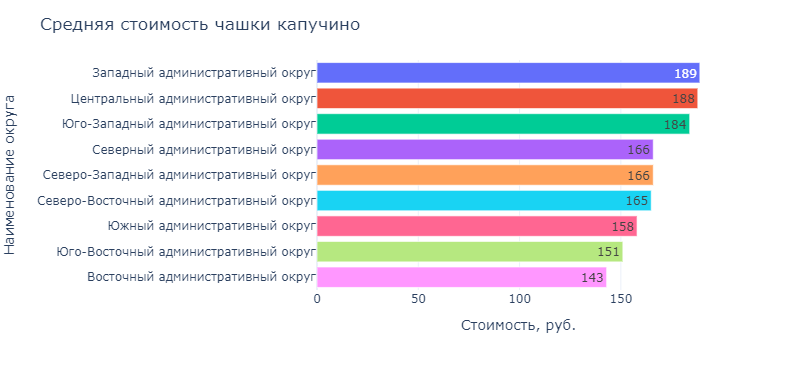

In [79]:
# Отображаю распределение кофеин по административным округам и средней стоимости чашки кофе на карте
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=cup_of_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средняя стоимость чашки капучино по административным округам',
).add_to(m6)

m6

Построю гистограмму стоимости кофе в кофейнях.        

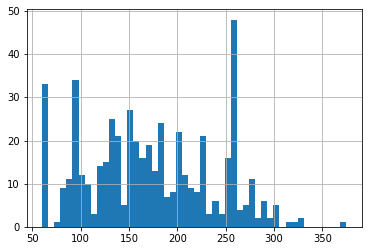

In [80]:
coffee['middle_coffee_cup'].hist(bins=50);

Наиболее часто встречающейся стоимостью чашки кофе является примерно 260 рублей.

In [81]:
# Найду кофейни, в которых кофе стоит от 250 до 270 рублей
coffee_250 = coffee.query('250 < middle_coffee_cup < 270')
coffee_250

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
151,шоколадница,кофейня,"москва, дмитровское шоссе, 163ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.91,37.54,4.10,NaN,Цена чашки капучино:239–274 ₽,NaN,256.00,1,NaN,дмитровское шоссе,False
240,шоколадница,кофейня,"москва, широкая улица, 13а",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.89,37.66,4.10,NaN,Цена чашки капучино:239–274 ₽,NaN,256.00,1,75.00,широкая улица,False
343,шоколадница,кофейня,"москва, фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.86,37.48,4.30,NaN,Цена чашки капучино:239–274 ₽,NaN,256.00,1,100.00,фестивальная улица,False
360,шоколадница,кофейня,"москва, сходненская улица, 25",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.85,37.44,4.30,средние,Цена чашки капучино:239–274 ₽,NaN,256.00,1,130.00,сходненская улица,False
455,шоколадница,кофейня,"москва, улица адмирала макарова, 6, стр. 13",Северный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.84,37.49,4.20,средние,Цена чашки капучино:239–274 ₽,NaN,256.00,1,80.00,улица адмирала макарова,False
977,шоколадница,кофейня,"москва, снежная улица, 27",Северо-Восточный административный округ,"пн-пт 09:00–22:00; сб,вс 10:00–22:00",55.86,37.65,4.30,NaN,Цена чашки капучино:239–274 ₽,NaN,256.00,1,110.00,снежная улица,False
1003,jeffrey's кофе и сидр,кофейня,"москва, сельскохозяйственная улица, 38, корп. 1",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.85,37.63,4.50,средние,Цена чашки капучино:239–269 ₽,NaN,254.00,0,180.00,сельскохозяйственная улица,False
1027,шоколадница,кофейня,"москва, проезд дежнёва, 21",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.87,37.64,4.30,средние,Цена чашки капучино:239–274 ₽,NaN,256.00,1,62.00,проезд дежнёва,False
1282,шоколадница,кофейня,"москва, улица маршала бирюзова, 32",Северо-Западный административный округ,"ежедневно, 09:00–22:00",55.80,37.48,4.00,средние,Цена чашки капучино:239–274 ₽,NaN,256.00,1,174.00,улица маршала бирюзова,False
1469,шоколадница,кофейня,"москва, хорошёвское шоссе, 27",Северный административный округ,"ежедневно, 10:00–22:00",55.78,37.52,4.30,NaN,Цена чашки капучино:239–274 ₽,NaN,256.00,1,45.00,хорошёвское шоссе,False


In [82]:
# Сгруппирую найденные кофейни по названиям 
# и найду те, в которых чаще всего встречается цена кофе 260 рублей
coffee_250_gr = coffee_250.groupby('name', as_index=False)['middle_coffee_cup'].agg('count').\
sort_values('middle_coffee_cup', ascending=False)
coffee_250_gr

,name,middle_coffee_cup
6,шоколадница,49
0,bloom-n-brew,1
1,carrots and beans,1
2,jeffrey's кофе и сидр,1
3,каннибал кофе,1
4,кофе и мечты,1
5,кофейня на остоженке,1


Наиболее часто встречаемая цена за кофе составляет примерно 260 рублей. Данная цена установлена в кофейнях "Шоколадница". Это самая распространенная сеть заведений общественного питания в Москве.

**Вывод**

- Средняя стоимость чашки кофе в Москве - 168 рублей. 
- Самый дорогой кофе в Западном, Центральном и Юго-Западном округах, самый дешевый - в Восточном.
- Наиболее часто встречаемая цена за кофе составляет примерно 260 рублей. Данная цена установлена в кофейнях "Шоколадница". Это самая распространенная сеть заведений общественного питания в Москве.

### Рекомендации по открытию кофейни
<a id="4.5"></a> 

Для открытия кофейни стоит рассматривать *Западный административный округ* по следующим причинам:
- В Западном округе самая высокая средняя стоимость чашки кофе. Это может позволить установить достаточно высокую цену на старте продаж без существенных потерь для привлечения клиентов.
- В Западном округе самый низкий рейтинг у кофеен, что может стать преимуществом при открытии нового заведения.
- Количество кофеен в Западном округе не самое высокое по Москве, как например в Центральном округе. При этом этот район можно считать привлекательным для прогулок, значит проходимость нового заведения может быть высокой.
- В Западном округе не много круглосуточных кофеен. Возможно, стоит попробовать поэкспериментировать с круглосуточным режимом работы и посмотреть будут ли в ночное время посетители.

## Презентация
<a id="5"></a>

Ссылка на презентацию: